# Pandora T0 Shape Study

### Created by Shu, 20260615

### Based on Beam Run 28891

In [2]:
from dataclasses import dataclass
import pandas as pd


@dataclass
class MatchedMichelEvent:
    run: int = None
    event: int = None
    trackID: int = None

    startX: float = None
    startY: float = None
    startZ: float = None

    endX: float = None
    endY: float = None
    endZ: float = None

    pandoraT0: float = None


def read_one_part(end_file, t0_file, vertex_file):
    """
    Read one group of End, Pandora_T0, and Vertex txt files.
    Merge them using Run/Event/TrackID.
    """

    df_end = pd.read_csv(end_file, sep=r"\s+")
    df_t0 = pd.read_csv(t0_file, sep=r"\s+")
    df_vertex = pd.read_csv(vertex_file, sep=r"\s+")

    # Merge by keys
    df = df_end.merge(df_t0, on=["Run", "Event", "TrackID"])
    df = df.merge(df_vertex, on=["Run", "Event", "TrackID"])

    events = []

    for _, row in df.iterrows():
        ev = MatchedMichelEvent(
            run=int(row["Run"]),
            event=int(row["Event"]),
            trackID=int(row["TrackID"]),

            startX=float(row["VertexX"]),
            startY=float(row["VertexY"]),
            startZ=float(row["VertexZ"]),

            endX=float(row["EndX"]),
            endY=float(row["EndY"]),
            endZ=float(row["EndZ"]),

            pandoraT0=float(row["Pandora_T0_ms"])
        )

        events.append(ev)

    return events


# ============================================================
# Read all three parts in order
# ============================================================

all_matched_events = []

all_matched_events += read_one_part(
    "end_xyz_part1.txt",
    "pandora_t0_part1.txt",
    "vertex_xyz_part1.txt"
)

all_matched_events += read_one_part(
    "end_xyz_part2.txt",
    "pandora_t0_part2.txt",
    "vertex_xyz_part2.txt"
)

all_matched_events += read_one_part(
    "end_xyz_part3.txt",
    "pandora_t0_part3.txt",
    "vertex_xyz_part3.txt"
)





# Remove duplicated events-----------------------
all_matched_events_unique = []

seen = set()

for ev in all_matched_events:

    key = (ev.run, ev.event, ev.trackID)

    if key not in seen:
        seen.add(key)
        all_matched_events_unique.append(ev)

print("Original events :", len(all_matched_events))
print("Unique events   :", len(all_matched_events_unique))
print("Removed         :", len(all_matched_events) - len(all_matched_events_unique))



print("\nTotal matched events:", len(all_matched_events_unique))

# Quick check
print("\nSingle Event test:")
print(all_matched_events_unique[17])




Original events : 34514
Unique events   : 34469
Removed         : 45

Total matched events: 34469

Single Event test:
MatchedMichelEvent(run=28891, event=3083, trackID=13, startX=115.748, startY=365.699, startZ=291.219, endX=-23.6016, endY=243.068, endZ=337.354, pandoraT0=-1.76288)


<br />
<br />

### Pandora T0 distribution after TPC cuts

#vals_pandoraT0_initial:  34469

Examples:  [-1.63163, -0.15212, -2.23885, 0.0419427, -1.69784, 0.175169, -1.66934, 0.00202078, 0.372527, 1.9559]


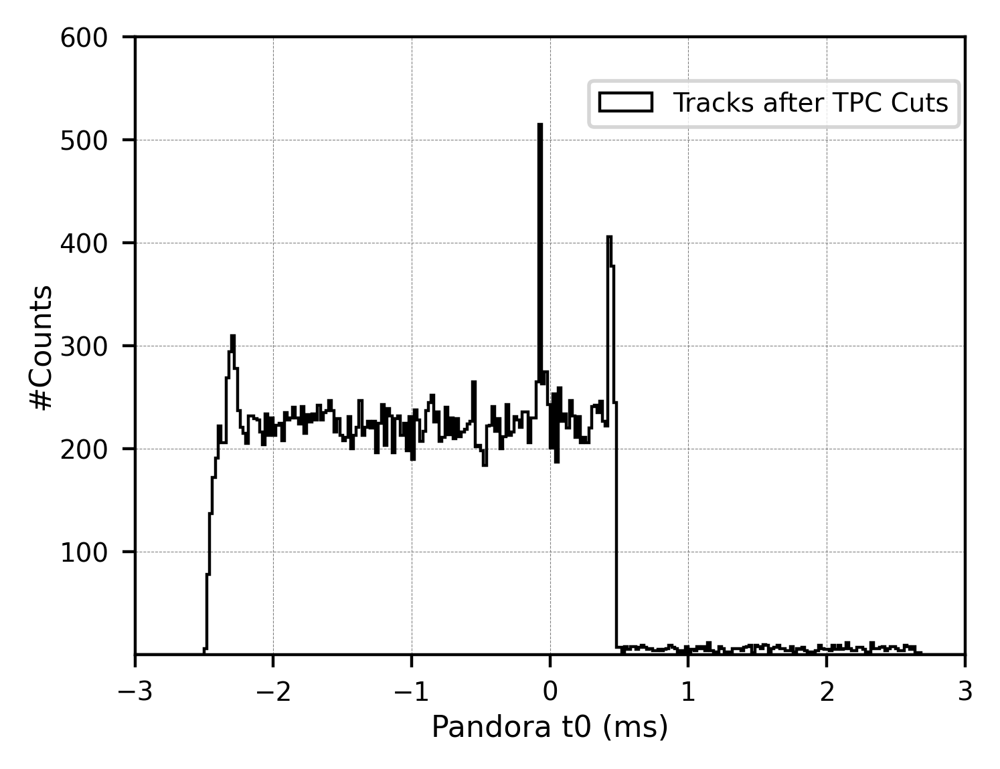

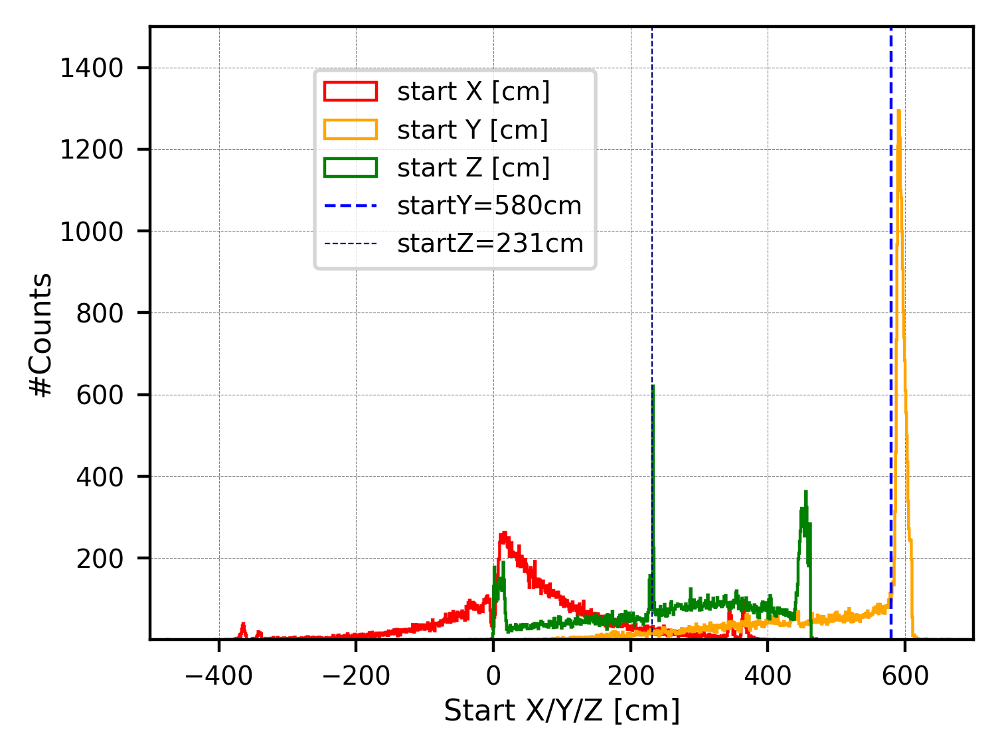

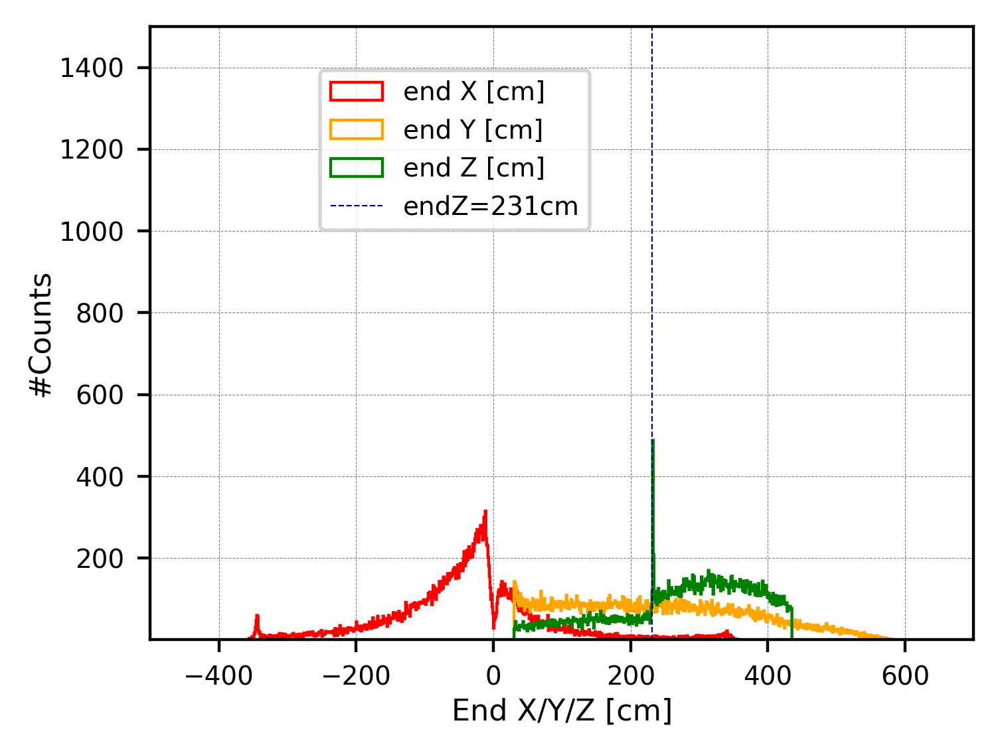

In [12]:
import matplotlib.pyplot as plt
import numpy as np


vals_pandoraT0_initial = [ev.pandoraT0 for ev in all_matched_events_unique]

print("#vals_pandoraT0_initial: ", len(vals_pandoraT0_initial))
print("\nExamples: ", vals_pandoraT0_initial[:10])



# Plotting the histogram (pandoraT0 distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 0.02
range_min = -5
range_max = 5
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_pandoraT0_initial, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label="Tracks after TPC Cuts")

#plt.plot([0.42, 0.42], [0, 40000], color="red", linewidth=0.4, linestyle='--')
#plt.plot([0.46, 0.46], [0, 40000], color="red", linewidth=0.4, linestyle='--')


plt.xlim(-3, 3)
plt.xlabel('Pandora t0 (ms)', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.1, 600)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  






#Spatial Distribution:===============================================
vals_startX_initial = [ev.startX for ev in all_matched_events_unique]
vals_startY_initial = [ev.startY for ev in all_matched_events_unique]
vals_startZ_initial = [ev.startZ for ev in all_matched_events_unique]

vals_endX_initial = [ev.endX for ev in all_matched_events_unique]
vals_endY_initial = [ev.endY for ev in all_matched_events_unique]
vals_endZ_initial = [ev.endZ for ev in all_matched_events_unique]



# start X/Y/Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_startX_initial, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=0.8, label="start X [cm]")
plt.hist(vals_startY_initial, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='step', linewidth=0.8, label="start Y [cm]")
plt.hist(vals_startZ_initial, bins=bins, range=(range_min, range_max), edgecolor='green', 
         histtype='step', linewidth=0.8, label="start Z [cm]")

plt.plot([580, 580], [0, 40000], color="blue", linewidth=0.8, linestyle='--', label='startY=580cm')
plt.plot([231, 231], [0, 40000], color="navy", linewidth=0.4, linestyle='--', label='startZ=231cm')


plt.xlim(-500, 700)
plt.xlabel('Start X/Y/Z [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1500)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.37, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  





# endX/Y/Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_endX_initial, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=0.8, label="end X [cm]")
plt.hist(vals_endY_initial, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='step', linewidth=0.8, label="end Y [cm]")
plt.hist(vals_endZ_initial, bins=bins, range=(range_min, range_max), edgecolor='green', 
         histtype='step', linewidth=0.8, label="end Z [cm]")

plt.plot([231, 231], [0, 40000], color="navy", linewidth=0.4, linestyle='--', label='endZ=231cm')

plt.xlim(-500, 700)
plt.xlabel('End X/Y/Z [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1500)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.37, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  








<br />
<br />

### Look at pandoraT0 Peaks---


#left_peak_events:  1150 / 34469 (3.34%)
#beam_events:  515 / 34469 (1.49%)
#right_peak_events:  783 / 34469 (2.27%)
#random_events:  1068 / 34469 (3.10%)


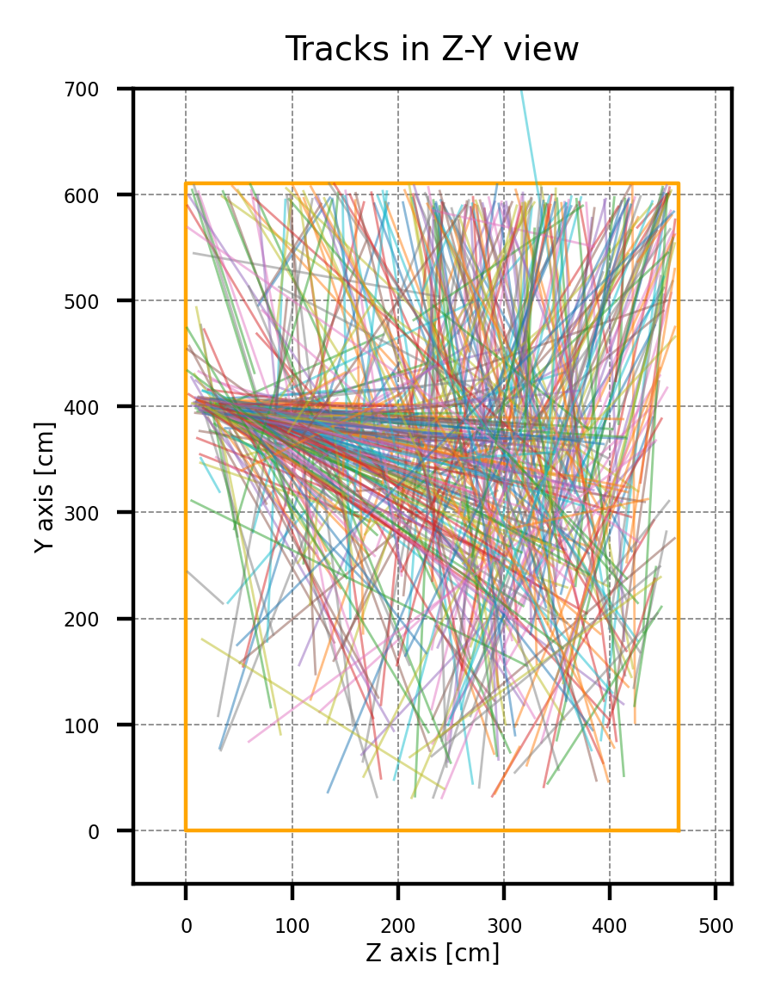

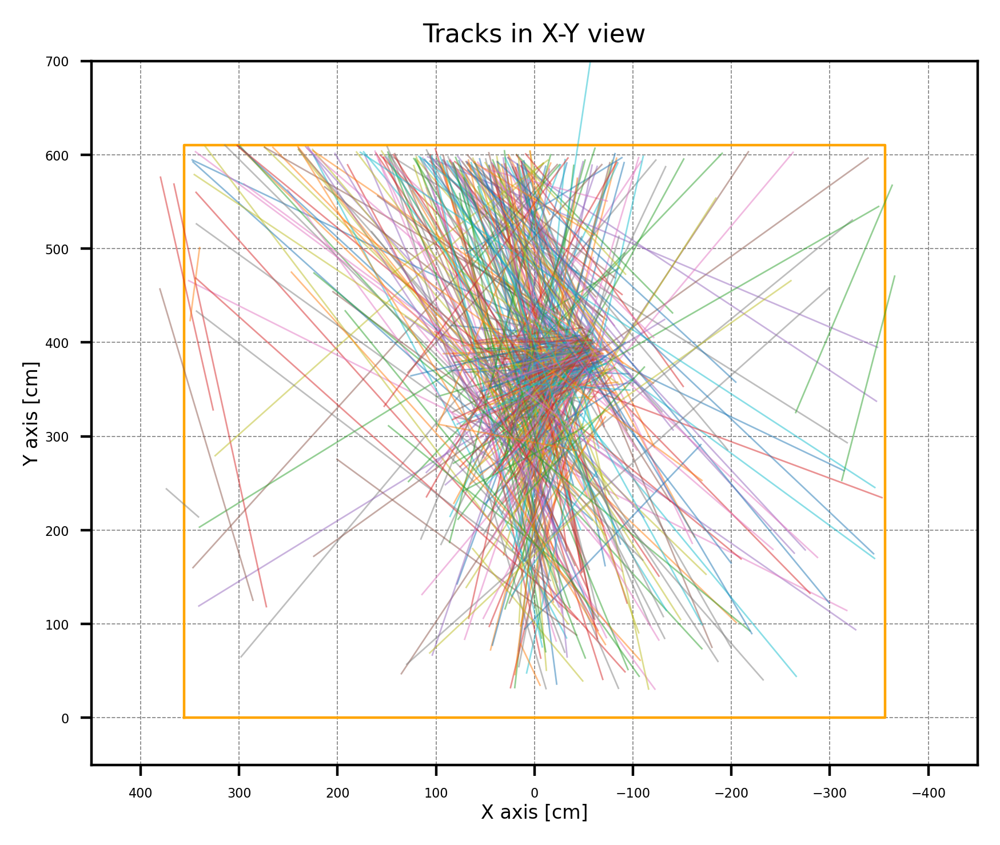

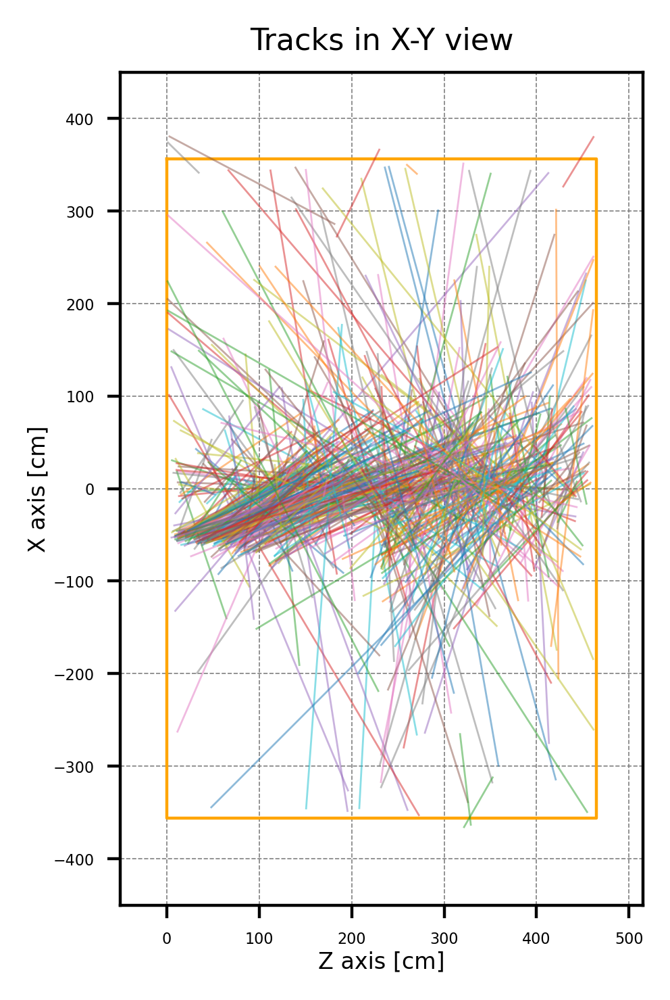

In [23]:
left_peak_events = []
beam_events = []
right_peak_events = []
random_events = []

for cand in all_matched_events_unique:
    time = cand.pandoraT0

    if -2.34 < time < -2.26: #default---
        left_peak_events.append(cand)
    if -0.08 < time < -0.06:
        beam_events.append(cand)
    if 0.42 < time < 0.46:
        right_peak_events.append(cand)
    if -0.5 < time < -0.4: #random events to do some diagnosis---
        random_events.append(cand)

print("#left_peak_events: ", len(left_peak_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(left_peak_events)/len(all_matched_events_unique)*100))
print("#beam_events: ", len(beam_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(beam_events)/len(all_matched_events_unique)*100))
print("#right_peak_events: ", len(right_peak_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(right_peak_events)/len(all_matched_events_unique)*100))
print("#random_events: ", len(random_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(random_events)/len(all_matched_events_unique)*100))


#------------------------------------------------------------
# all_matched_events_unique
# left_peak_events, beam_events, right_peak_events
vals_startX_upDown = [ev.startX for ev in beam_events]
vals_startY_upDown  = [ev.startY for ev in beam_events]
vals_startZ_upDown  = [ev.startZ for ev in beam_events]

vals_endX_upDown  = [ev.endX for ev in beam_events]
vals_endY_upDown  = [ev.endY for ev in beam_events]
vals_endZ_upDown  = [ev.endZ for ev in beam_events]



# =========================
# Plot 1: Z-Y view
# =========================
plt.figure(figsize=(4, 3), dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [465,465, 0, 0, 465]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sZ, sY, eZ, eY in zip(vals_startZ_upDown, vals_startY_upDown,
                          vals_endZ_upDown, vals_endY_upDown):
    plt.plot([sZ, eZ], [sY, eY], linewidth=0.5, alpha=0.5)


plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.axis("scaled")
plt.ylim(-50, 700)
plt.xlim(-50, 515)
plt.title('Tracks in Z-Y view', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()




# =========================
# Plot 2: X-Y view
# =========================
plt.figure(figsize=(5, 4), dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sX, sY, eX, eY in zip(vals_startX_upDown, vals_startY_upDown,
                          vals_endX_upDown, vals_endY_upDown):
    plt.plot([sX, eX], [sY, eY], linewidth=0.5, alpha=0.5)

plt.ylabel('Y axis [cm]', labelpad=1, fontsize=6)
plt.xlabel('X axis [cm]', labelpad=1, fontsize=6)
plt.ylim(-50, 700)
plt.xlim(-450, 450)
plt.gca().invert_xaxis()  # Flip x-axis
plt.title('Tracks in X-Y view', fontsize=8)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()




# =========================
# Plot 2: Z-X view
# =========================
plt.figure(figsize=(5, 4), dpi=400)

#auxiliary line,---
aux1 = [0,465, 465, 0, 0]
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sZ, sX, eZ, eX in zip(vals_startZ_upDown, vals_startX_upDown,
                          vals_endZ_upDown, vals_endX_upDown):
    plt.plot([sZ, eZ], [sX, eX], linewidth=0.5, alpha=0.5)

plt.ylabel('X axis [cm]', labelpad=1, fontsize=6)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=6)
plt.axis("scaled")
plt.ylim(-450, 450)
plt.xlim(-50, 515)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.title('Tracks in X-Y view', fontsize=8)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()




<br />
<br />

### Look at abnormal Z values---

#ab_startZ_events:  621 / 34469 (1.80%)
#ab_endZ_events:  488 / 34469 (1.42%)
#ab_startZ_endZ_events:  5 / 34469 (0.01%)


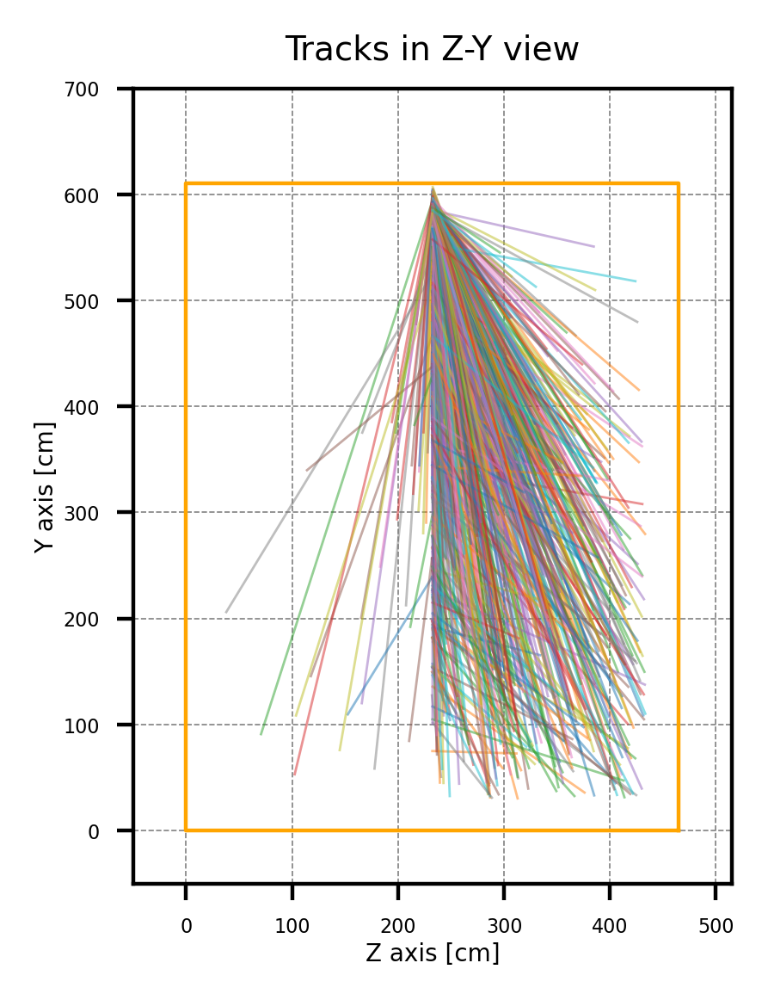

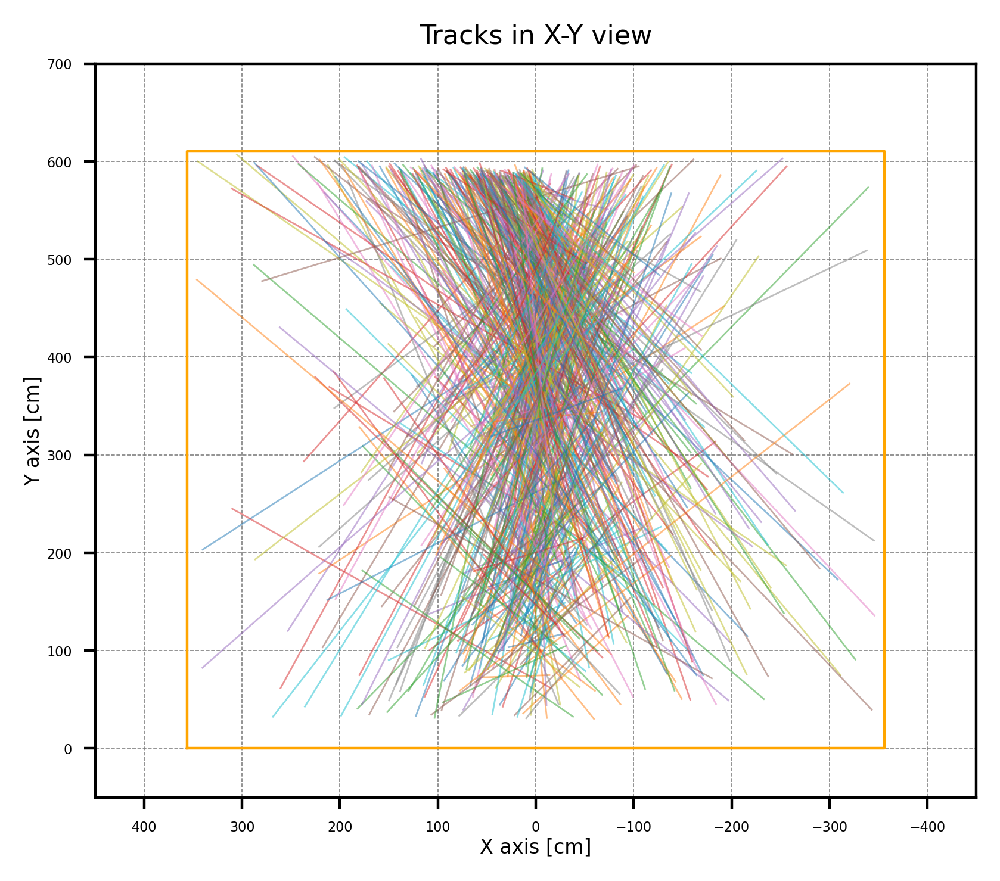

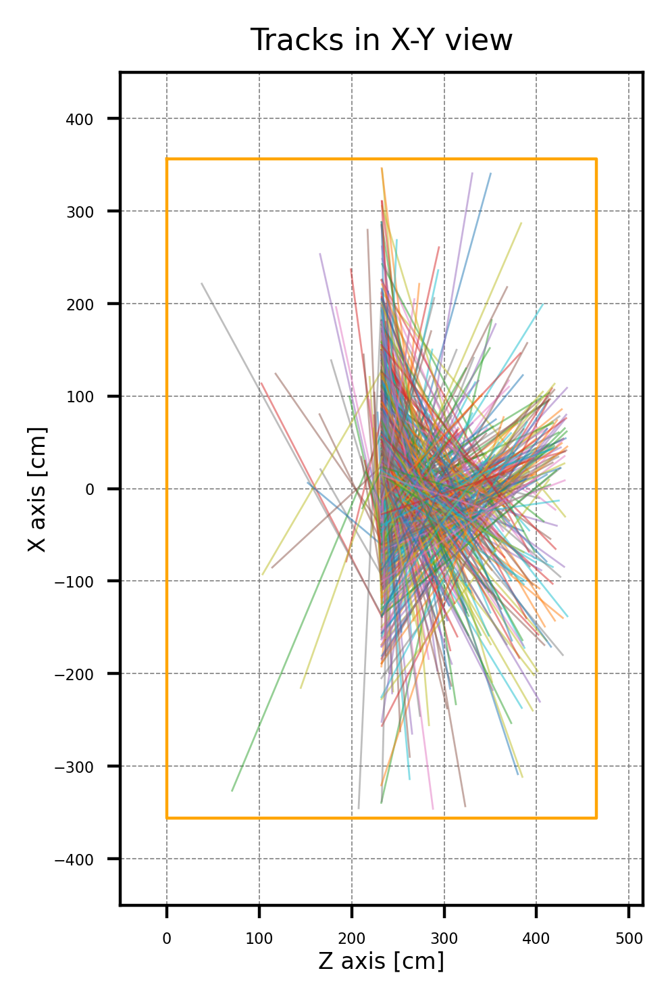

In [5]:
ab_startZ_events = []
ab_endZ_events = []
ab_startZ_endZ_events = []

for cand in all_matched_events_unique:
    sZ = cand.startZ
    eZ = cand.endZ

    if 232 <= sZ <= 233:
        ab_startZ_events.append(cand)
    if 232 <= eZ <= 233:
        ab_endZ_events.append(cand)
    if 232 <= sZ <= 233 and 232 <= eZ <= 233:
        ab_startZ_endZ_events.append(cand)


print("#ab_startZ_events: ", len(ab_startZ_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(ab_startZ_events)/len(all_matched_events_unique)*100))
print("#ab_endZ_events: ", len(ab_endZ_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(ab_endZ_events)/len(all_matched_events_unique)*100))
print("#ab_startZ_endZ_events: ", len(ab_startZ_endZ_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(ab_startZ_endZ_events)/len(all_matched_events_unique)*100))

#------------------------------------------------------------
vals_startX_upDown = [ev.startX for ev in ab_startZ_events]
vals_startY_upDown  = [ev.startY for ev in ab_startZ_events]
vals_startZ_upDown  = [ev.startZ for ev in ab_startZ_events]

vals_endX_upDown  = [ev.endX for ev in ab_startZ_events]
vals_endY_upDown  = [ev.endY for ev in ab_startZ_events]
vals_endZ_upDown  = [ev.endZ for ev in ab_startZ_events]



# =========================
# Plot 1: Z-Y view
# =========================
plt.figure(figsize=(4, 3), dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [465,465, 0, 0, 465]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sZ, sY, eZ, eY in zip(vals_startZ_upDown, vals_startY_upDown,
                          vals_endZ_upDown, vals_endY_upDown):
    plt.plot([sZ, eZ], [sY, eY], linewidth=0.5, alpha=0.5)


plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.axis("scaled")
plt.ylim(-50, 700)
plt.xlim(-50, 515)
plt.title('Tracks in Z-Y view', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()




# =========================
# Plot 2: X-Y view
# =========================
plt.figure(figsize=(5, 4), dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sX, sY, eX, eY in zip(vals_startX_upDown, vals_startY_upDown,
                          vals_endX_upDown, vals_endY_upDown):
    plt.plot([sX, eX], [sY, eY], linewidth=0.5, alpha=0.5)

plt.ylabel('Y axis [cm]', labelpad=1, fontsize=6)
plt.xlabel('X axis [cm]', labelpad=1, fontsize=6)
plt.axis("scaled")
plt.ylim(-50, 700)
plt.xlim(-450, 450)
plt.gca().invert_xaxis()  # Flip x-axis
plt.title('Tracks in X-Y view', fontsize=8)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()





# =========================
# Plot 2: Z-X view
# =========================
plt.figure(figsize=(5, 4), dpi=400)

#auxiliary line,---
aux1 = [0,465, 465, 0, 0]
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sZ, sX, eZ, eX in zip(vals_startZ_upDown, vals_startX_upDown,
                          vals_endZ_upDown, vals_endX_upDown):
    plt.plot([sZ, eZ], [sX, eX], linewidth=0.5, alpha=0.5)

plt.ylabel('X axis [cm]', labelpad=1, fontsize=6)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=6)
plt.axis("scaled")
plt.ylim(-450, 450)
plt.xlim(-50, 515)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.title('Tracks in X-Y view', fontsize=8)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()



<br />
<br />

### Explore Alex's Proposal [Up-down events]

#upDown_events:  18332 / 34469 (53.18%)

#vals_pandoraT0_upDown:  18332

Examples:  [-0.15212, -2.23885, 0.0419427, -1.69784, -1.66934, 0.00202078, 0.372527, 1.9559, -0.129544, -1.30009]


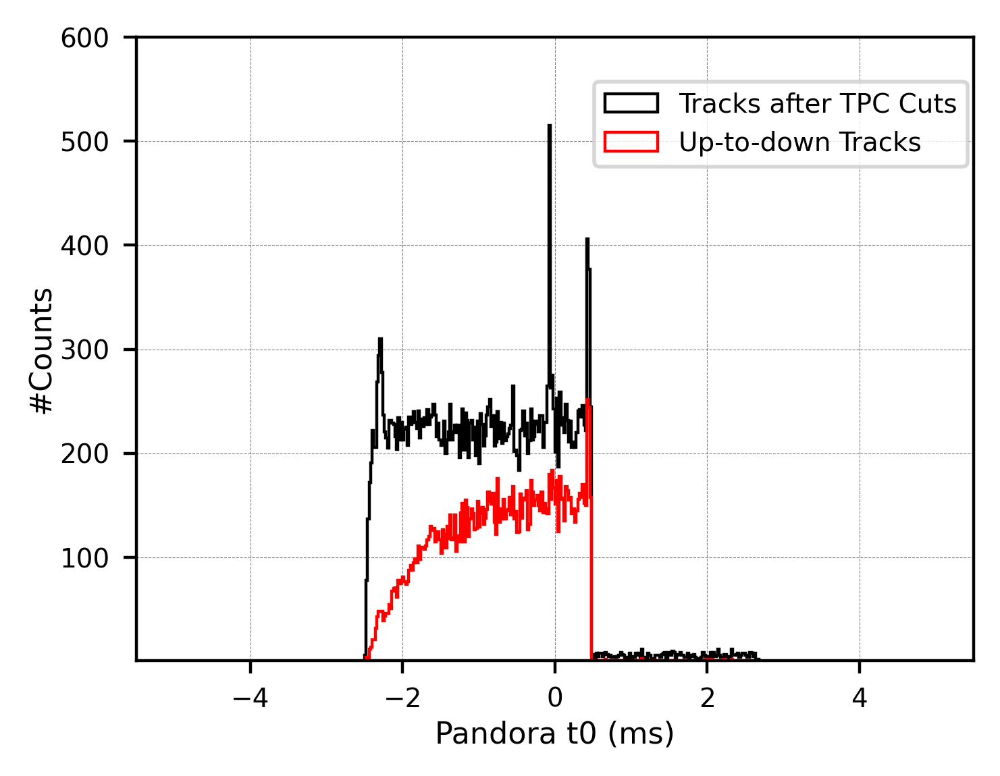

In [16]:

upDown_events = []

for cand in all_matched_events_unique:
    sY = cand.startY

    if sY > 580:
        upDown_events.append(cand)

print("#upDown_events: ", len(upDown_events), "/", len(all_matched_events_unique),
      "({:.2f}%)".format(len(upDown_events)/len(all_matched_events_unique)*100))




vals_pandoraT0_upDown = [ev.pandoraT0 for ev in upDown_events]

print("\n#vals_pandoraT0_upDown: ", len(vals_pandoraT0_upDown))
print("\nExamples: ", vals_pandoraT0_upDown[:10])



# Plotting the histogram (pandoraT0 distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 0.02
range_min = -5
range_max = 5
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_pandoraT0_initial, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label="Tracks after TPC Cuts")
plt.hist(vals_pandoraT0_upDown, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=0.8, label="Up-to-down Tracks")

#plt.xlim(-450, 450)
plt.xlabel('Pandora t0 (ms)', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 600)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  



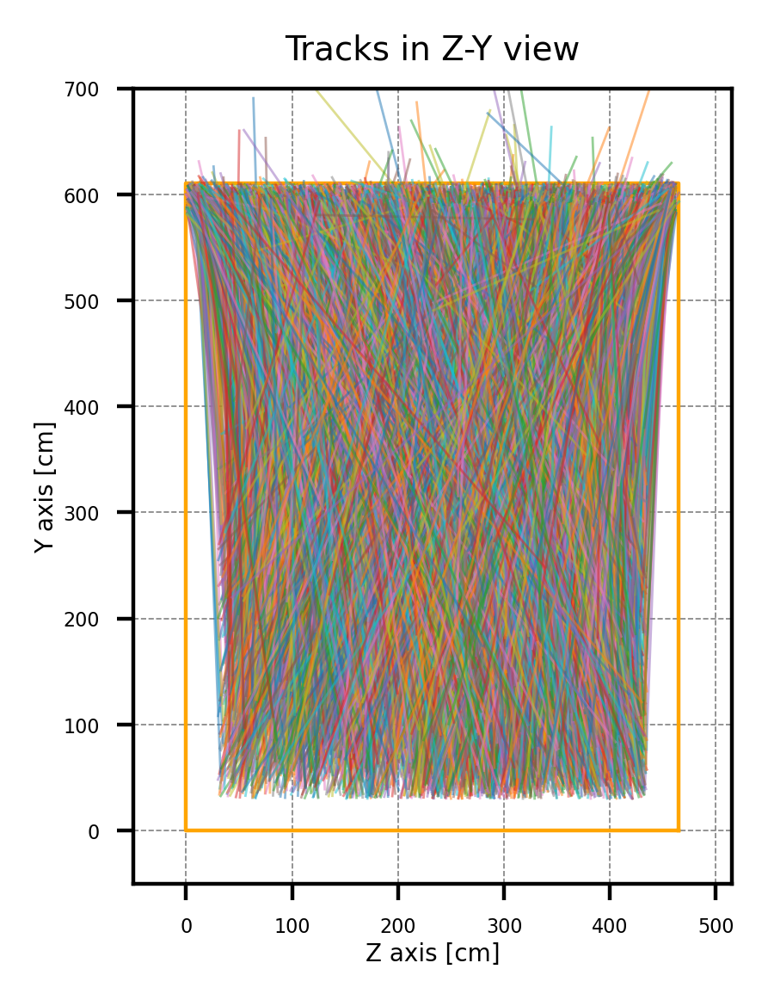

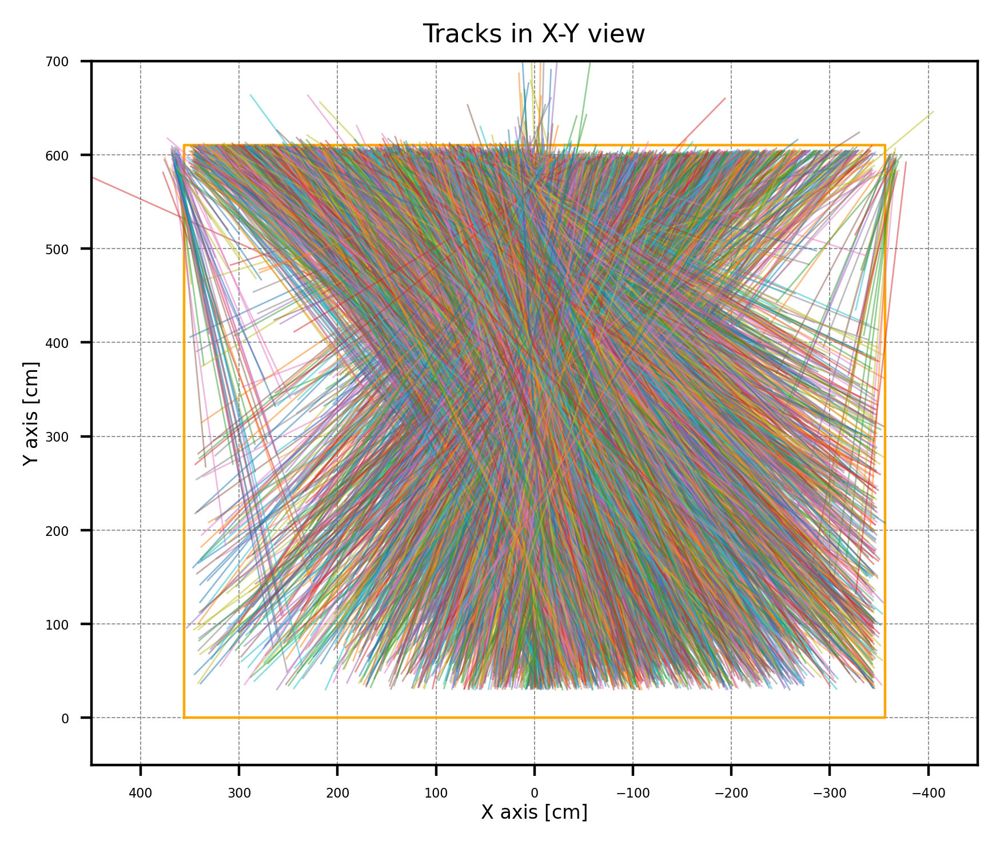

In [7]:

vals_startX_upDown = [ev.startX for ev in upDown_events]
vals_startY_upDown  = [ev.startY for ev in upDown_events]
vals_startZ_upDown  = [ev.startZ for ev in upDown_events]

vals_endX_upDown  = [ev.endX for ev in upDown_events]
vals_endY_upDown  = [ev.endY for ev in upDown_events]
vals_endZ_upDown  = [ev.endZ for ev in upDown_events]



# =========================
# Plot 1: Z-Y view
# =========================
plt.figure(figsize=(4, 3), dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [465,465, 0, 0, 465]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sZ, sY, eZ, eY in zip(vals_startZ_upDown, vals_startY_upDown,
                          vals_endZ_upDown, vals_endY_upDown):
    plt.plot([sZ, eZ], [sY, eY], linewidth=0.5, alpha=0.5)


plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.axis("scaled")
plt.ylim(-50, 700)
plt.xlim(-50, 515)
plt.title('Tracks in Z-Y view', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()




# =========================
# Plot 2: X-Y view
# =========================
plt.figure(figsize=(5, 4), dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="orange", linewidth=0.8, linestyle='-')

for sX, sY, eX, eY in zip(vals_startX_upDown, vals_startY_upDown,
                          vals_endX_upDown, vals_endY_upDown):
    plt.plot([sX, eX], [sY, eY], linewidth=0.5, alpha=0.5)

plt.ylabel('Y axis [cm]', labelpad=1, fontsize=6)
plt.xlabel('X axis [cm]', labelpad=1, fontsize=6)
plt.ylim(-50, 700)
plt.xlim(-450, 450)
plt.gca().invert_xaxis()  # Flip x-axis
plt.title('Tracks in X-Y view', fontsize=8)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()

